<h1 align="center">EDA PCRF RESERVATIONS</h1>

<div style="text-align:center">
    <img src='https://i.ibb.co/CVZwy4H/4e8fc915e2c38.webp'>
</div>

In this Jupyter Notebook, we’ll analyze the data from Mesa - Arizona Parks to discover sights and behavior patterns of the Mesa residents and tourists who visit these installations. Subsequently, from the data that will be cleaned, we can use a machine learning model to classify the installations with common features.

### IMPORTING LIBRARIES

We’ll import the necessary libraries for the analysis, including API libraries (sodapy - Socrata) to extract the data:

In [1]:
import pandas as pd
from sodapy import Socrata
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MousePosition
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
import warnings
import os
import urllib

### DEFINING VISUALIZATION VALUES

Next, let’s define the values that will affect the visualization options:

See all rows and columns in the dataset:

In [2]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)


Mute the warnings in the output:

In [3]:
warnings.filterwarnings("ignore")

Set the seaborn styles for the plots:

In [4]:
sns.set_style("darkgrid")
colors_arbitrary=sns.color_palette("hls",4)

### DATA COLLECTION AND DATA WRANGLING

#### APPLIYNG THE API REQUEST TO EXTRACT DATA FROM SOCRATA

With the following code, we’ll extract the data using Socrata’s client library:

In [5]:
#client = Socrata("citydata.mesaaz.gov", None)
#results = client.get("resf-c4x9", limit=495000)
#df = pd.DataFrame.from_records(results)

In [6]:
#df.sample(5)

The information has been extracted successfully!

To minimize API request numbers that could trigger processing issues, we must save the data in a CSV file:

In [7]:
project_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
data_dir = os.path.join(project_dir, "data", "raw")
os.makedirs(data_dir, exist_ok=True)

Let's read the data:

In [8]:
output_path = os.path.join(data_dir,"PRCF_reservation.csv")

Let's read the saved data:

In [9]:
df_s=pd.read_csv(output_path)
df_s.head(5)

,row_id,facility_name,facility_type,center_name,center_address_1,center_city,center_state,center_zip_code,center_country,center_longitude,center_latitude,center_geolocation,center_phone_number_1,center_fax,site_name,permit_number,permit_date,permit_year,permit_month,permit_status,event_type,event_start_date,event_start_year,event_start_month,event_start_time,event_end_date,event_end_year,event_end_month,event_end_time,day_of_week,attendance,hours_reserved,schedule_type,transaction_site,residency_flag,customer_gender,customer_city,customer_state,customer_zip_code,center_address_2,center_phone_number_2
0,38358222022-01-2710:00:0011:00:00,Group Fitness,Room - Fitness,Red Mountain Center,7550 E Adobe St,Mesa,AZ,85207,US,-111.662972,33.432725,"{'type': 'Point', 'coordinates': [-111.6629719...",4.806445e+09,4.806445e+09,Recreation Centers,35822.0,2019-06-03T14:06:08.000,2019,June,Approved,Administrative,2022-01-27T00:00:00.000,2022,January,10:00:00,2022-01-27T00:00:00.000,2022,January,11:00:00,Thursday,1.0,1.00,Reservation: Internal,Recreation Centers,False,Mixed,NaN,NaN,NaN,NaN,NaN
1,38358232022-01-2711:00:0011:45:00,Group Fitness,Room - Fitness,Red Mountain Center,7550 E Adobe St,Mesa,AZ,85207,US,-111.662972,33.432725,"{'type': 'Point', 'coordinates': [-111.6629719...",4.806445e+09,4.806445e+09,Recreation Centers,35823.0,2019-06-03T14:10:40.000,2019,June,Approved,Administrative,2022-01-27T00:00:00.000,2022,January,11:00:00,2022-01-27T00:00:00.000,2022,January,11:45:00,Thursday,1.0,0.75,Reservation: Internal,Recreation Centers,False,Mixed,NaN,NaN,NaN,NaN,NaN
2,38358352022-01-2712:00:0012:45:00,Group Fitness,Room - Fitness,Red Mountain Center,7550 E Adobe St,Mesa,AZ,85207,US,-111.662972,33.432725,"{'type': 'Point', 'coordinates': [-111.6629719...",4.806445e+09,4.806445e+09,Recreation Centers,35835.0,2019-06-03T14:55:59.000,2019,June,Approved,Administrative,2022-01-27T00:00:00.000,2022,January,12:00:00,2022-01-27T00:00:00.000,2022,January,12:45:00,Thursday,1.0,0.75,Reservation: Internal,Recreation Centers,False,Mixed,NaN,NaN,NaN,NaN,NaN
3,38556902022-02-1509:30:0010:00:00,Group Fitness,Room - Fitness,Red Mountain Center,7550 E Adobe St,Mesa,AZ,85207,US,-111.662972,33.432725,"{'type': 'Point', 'coordinates': [-111.6629719...",4.806445e+09,4.806445e+09,Recreation Centers,55690.0,2021-12-06T11:19:44.000,2021,December,Approved,Administrative,2022-02-15T00:00:00.000,2022,February,09:30:00,2022-02-15T00:00:00.000,2022,February,10:00:00,Tuesday,30.0,0.50,Reservation: Internal,Recreation Centers,False,Mixed,NaN,NaN,NaN,NaN,NaN
4,78358362022-01-2711:00:0012:00:00,Gymnasium - Entire,Gymnasium,Red Mountain Center,7550 E Adobe St,Mesa,AZ,85207,US,-111.662972,33.432725,"{'type': 'Point', 'coordinates': [-111.6629719...",4.806445e+09,4.806445e+09,Recreation Centers,35836.0,2019-06-03T14:59:07.000,2019,June,Approved,Administrative,2022-01-27T00:00:00.000,2022,January,11:00:00,2022-01-27T00:00:00.000,2022,January,12:00:00,Thursday,1.0,1.00,Reservation: Internal,Recreation Centers,False,Mixed,NaN,NaN,NaN,NaN,NaN


In [10]:
df_s.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 495000 entries, 0 to 494999
Data columns (total 41 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   row_id                 495000 non-null  object 
 1   facility_name          495000 non-null  object 
 2   facility_type          495000 non-null  object 
 3   center_name            495000 non-null  object 
 4   center_address_1       495000 non-null  object 
 5   center_city            495000 non-null  object 
 6   center_state           495000 non-null  object 
 7   center_zip_code        495000 non-null  object 
 8   center_country         495000 non-null  object 
 9   center_longitude       495000 non-null  float64
 10  center_latitude        495000 non-null  float64
 11  center_geolocation     495000 non-null  object 
 12  center_phone_number_1  450342 non-null  float64
 13  center_fax             136575 non-null  float64
 14  site_name              495000 non-nu

In [11]:
df_s.shape

(495000, 41)

#### DATA DEPURATION

Let’s see the shape, data types, and NaN values to identify the columns that add value:

Let's see Nan values:

In [12]:
df_s.isna().sum()

row_id                        0
facility_name                 0
facility_type                 0
center_name                   0
center_address_1              0
center_city                   0
center_state                  0
center_zip_code               0
center_country                0
center_longitude              0
center_latitude               0
center_geolocation            0
center_phone_number_1     44658
center_fax               358425
site_name                     0
permit_number             60611
permit_date                   0
permit_year                   0
permit_month                  0
permit_status             60611
event_type                60611
event_start_date              0
event_start_year              0
event_start_month             0
event_start_time              0
event_end_date                0
event_end_year                0
event_end_month               0
event_end_time                0
day_of_week                   0
attendance                  103
hours_re

There are over 200k NaN values in columns 14, 37, 38, 39, 40, and 41, so we can remove them and remove NaN values.

At a glance, we can use columns 2, 3, 4, 10, 11, 12, 15, 18, 19, 21, 22, 23, 24, 25, 29, 30, 31, 32, 34, and 36. We should remove columns 0, 1, 5, 6, 7, 8, 9, 13, 16, 26, 27, 28 because they don’t add value to the analysis. Let’s check columns 17, 20, 33, and 35 to see if we can remove them from the dataset.

In [13]:
cols =[17,20,33,35]

for i in cols:
    print('content col No', i, ':', df_s.iloc[:,i].unique())
    print('-'*100)

content col No 17 : [2019 2021 2022 2024 2023 2020 2014 2015 2018 2017 2016 2013]
----------------------------------------------------------------------------------------------------
content col No 20 : ['Administrative' nan 'Maintenance Booking'
 'Mesa Tennis & Pickleball Center' 'Athletics Field Booking'
 'Standard Booking' 'Aquatic Specialized Use' 'Pool Reservation'
 'Kleinman Park Courts' 'Ramada' 'Community Youth Group Field'
 'Aquatic Club Teams - Practice 8 Lanes'
 'Aquatic Club Teams - Practice 4 Lanes'
 'Aquatic Club Teams - Practice 6 Lanes'
 'Aquatic Club Teams - Practice 10 Lanes'
 'Aquatic Club Teams - Practice 12 Lanes' 'Non-Profit' 'Aquatic Meets'
 'Aquatic Schools Practice' 'Aquatics Club Team Practice - 08 Lanes'
 'Aquatics Club Team Practice - 06 Lanes'
 'Aquatics Club Team Practice - 04 Lanes' 'FlowRider Reservation'
 'Commercial' 'Aquatics Club Team Practice - 18 Lanes'
 'Aquatics Club Team Practice - 16 Lanes'
 'Aquatics Club Team Practice - 12 Lanes'
 'Aquatics C

In [14]:
df_s["permit_status"].value_counts()

permit_status
Approved            434361
Tentative               19
Completed                8
Waiting Decision         1
Name: count, dtype: int64

Wa can conclude the following ponits:

- Column 17 has the permit hour, so we can extract that to see if it adds value to the analysis.
- We can use columns 35 for the analysis; maybe there are insights from them.
- The colunmn 33 doesn't add value, so we can drop it.
- For the column 20, the most common status (majority of records) is ‘Approved’, so we can drop it.


Let's remove these columns from the dataset and NaN values:

In [15]:
df_filtered = df_s.drop(columns=df_s[['row_id', 'center_fax','center_name','center_address_1','center_city','center_state','center_country',
                                  'center_zip_code','center_geolocation','center_phone_number_1','center_fax','transaction_site', 'permit_number'
                                  , 'permit_status','event_type','event_end_year', 'event_end_month'  , 'customer_zip_code','customer_city','customer_state',
                                   'center_address_2','center_phone_number_2']])

In [16]:
df_filtered.dropna(axis=0, how='any', subset=None, inplace=True)

In [17]:
df_filtered.isna().sum()

facility_name        0
facility_type        0
center_longitude     0
center_latitude      0
site_name            0
permit_date          0
permit_year          0
permit_month         0
event_start_date     0
event_start_year     0
event_start_month    0
event_start_time     0
event_end_date       0
event_end_time       0
day_of_week          0
attendance           0
hours_reserved       0
schedule_type        0
residency_flag       0
customer_gender      0
dtype: int64

In [18]:
df_filtered.shape

(434216, 20)

The dataset has been cleaned. Let’s extract the permit hour from column 'permit_date', and create a new column:

In [19]:
df_filtered.reset_index(drop=True, inplace=True)

permit_hour=[]

for i in range(0,len(df_filtered['permit_date'])):
    permit_hour.append(df_filtered['permit_date'][i][11:13])

permit_hour_col = pd.DataFrame(permit_hour, columns=['permit_hour'])

df_filtered['permit_hour'] = permit_hour_col

Let's extract the month and day from the 'event_start_date' column and create new columns:

In [20]:
df_filtered.reset_index(drop=True, inplace=True)

mounth_numeric=[]

for i in range(0,len(df_filtered['event_start_date'])):
    mounth_numeric.append(df_filtered['event_start_date'][i][5:7])

mounth_numeric_col = pd.DataFrame(mounth_numeric, columns=['event_mounth'])

df_filtered['event_start_mounth_numeric'] = mounth_numeric_col

In [21]:
df_filtered.reset_index(drop=True, inplace=True)

day_numeric=[]

for i in range(0,len(df_filtered['event_start_date'])):
    day_numeric.append(df_filtered['event_start_date'][i][8:10])

day_numeric_col = pd.DataFrame(day_numeric, columns=['event_day'])

df_filtered['event_start_day_numeric'] = day_numeric_col

Similarly, let's extract the day from the 'event_end_date' column and create new column:

In [22]:
df_filtered.reset_index(drop=True, inplace=True)

day_end_numeric=[]

for i in range(0,len(df_filtered['event_end_date'])):
    day_end_numeric.append(df_filtered['event_end_date'][i][8:10])

day_end_numeric_col = pd.DataFrame(day_end_numeric, columns=['event_end_day'])

df_filtered['event_end_day_numeric'] = day_end_numeric_col

In [23]:
df_filtered['event_start_time'] = pd.to_datetime(df_filtered['event_start_time'], format='%H:%M:%S')
df_filtered['event_end_time'] = pd.to_datetime(df_filtered['event_end_time'], format='%H:%M:%S')


We can extract the event duration from the dataset:

In [24]:
# Calcular la diferencia en segundos
df_filtered['event_duration'] = (df_filtered['event_end_time'] - df_filtered['event_start_time']).dt.total_seconds() / 3600

# Ajustar las duraciones negativas sumando 24 horas
df_filtered['event_duration'] = df_filtered['event_duration'].apply(lambda x: x if x >= 0 else x + 24)


Finally, we drop the obsolete columns that will not be used in further analysis:

In [25]:
df_filtered=df_filtered.drop(columns=['permit_date','event_start_date','event_end_date','event_end_time'])

In [26]:
df_filtered.head(3)

,facility_name,facility_type,center_longitude,center_latitude,site_name,permit_year,permit_month,event_start_year,event_start_month,event_start_time,day_of_week,attendance,hours_reserved,schedule_type,residency_flag,customer_gender,permit_hour,event_start_mounth_numeric,event_start_day_numeric,event_end_day_numeric,event_duration
0,Group Fitness,Room - Fitness,-111.662972,33.432725,Recreation Centers,2019,June,2022,January,1900-01-01 10:00:00,Thursday,1.0,1.00,Reservation: Internal,False,Mixed,14,01,27,27,1.00
1,Group Fitness,Room - Fitness,-111.662972,33.432725,Recreation Centers,2019,June,2022,January,1900-01-01 11:00:00,Thursday,1.0,0.75,Reservation: Internal,False,Mixed,14,01,27,27,0.75
2,Group Fitness,Room - Fitness,-111.662972,33.432725,Recreation Centers,2019,June,2022,January,1900-01-01 12:00:00,Thursday,1.0,0.75,Reservation: Internal,False,Mixed,14,01,27,27,0.75


Now we have the complete dataset for the analysis

In [27]:
df_filtered.dtypes

facility_name                         object
facility_type                         object
center_longitude                     float64
center_latitude                      float64
site_name                             object
permit_year                            int64
permit_month                          object
event_start_year                       int64
event_start_month                     object
event_start_time              datetime64[ns]
day_of_week                           object
attendance                           float64
hours_reserved                       float64
schedule_type                         object
residency_flag                        object
customer_gender                       object
permit_hour                           object
event_start_mounth_numeric            object
event_start_day_numeric               object
event_end_day_numeric                 object
event_duration                       float64
dtype: object

The numerical non category columns should have their data types changed for future analyses:

In [28]:
df_filtered['attendance'] = df_filtered['attendance'].astype(int)
df_filtered['hours_reserved'] = df_filtered[['hours_reserved']].astype(float)
df_filtered['permit_hour'] = df_filtered[['permit_hour']].astype(int)
df_filtered['event_start_mounth_numeric'] = df_filtered[['event_start_mounth_numeric']].astype(int)
df_filtered['event_start_day_numeric'] = df_filtered[['event_start_day_numeric']].astype(int)
df_filtered['event_end_day_numeric'] = df_filtered[['event_end_day_numeric']].astype(int)
df_filtered.dtypes

facility_name                         object
facility_type                         object
center_longitude                     float64
center_latitude                      float64
site_name                             object
permit_year                            int64
permit_month                          object
event_start_year                       int64
event_start_month                     object
event_start_time              datetime64[ns]
day_of_week                           object
attendance                             int32
hours_reserved                       float64
schedule_type                         object
residency_flag                        object
customer_gender                       object
permit_hour                            int32
event_start_mounth_numeric             int32
event_start_day_numeric                int32
event_end_day_numeric                  int32
event_duration                       float64
dtype: object

### STADISTICAL ANALYSIS

Let’s see some statistical data from non-categorical and categorical variables.

In [29]:
df_filtered.describe()

,center_longitude,center_latitude,permit_year,event_start_year,event_start_time,attendance,hours_reserved,permit_hour,event_start_mounth_numeric,event_start_day_numeric,event_end_day_numeric,event_duration
count,434216.000000,434216.000000,434216.000000,434216.000000,434216,434216.000000,434216.000000,434216.000000,434216.000000,434216.000000,434216.000000,434216.000000
mean,-111.737539,33.429333,2019.441824,2019.743759,1900-01-01 12:24:14.258249984,31.382862,4.534546,12.601740,6.320988,15.548653,15.548630,4.532114
min,-111.887011,33.324176,2014.000000,2015.000000,1900-01-01 00:00:00,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000
25%,-111.795801,33.409799,2017.000000,2017.000000,1900-01-01 07:30:00,1.000000,1.500000,10.000000,3.000000,8.000000,8.000000,1.500000
50%,-111.741478,33.432725,2020.000000,2020.000000,1900-01-01 12:00:00,10.000000,2.500000,13.000000,6.000000,15.000000,15.000000,2.500000
75%,-111.666066,33.449963,2022.000000,2022.000000,1900-01-01 17:00:00,30.000000,5.000000,15.000000,9.000000,23.000000,23.000000,5.000000
max,-111.597625,33.477355,2024.000000,2024.000000,1900-01-01 23:00:00,15000.000000,96.000000,23.000000,12.000000,31.000000,31.000000,23.750000
std,0.073621,0.027086,2.842611,2.791134,NaN,118.468178,4.792396,3.059983,3.432860,8.724903,8.724877,4.775175


The columns "center_longitude" and "center_latitude" don't make sense to analysis. The columns "permit_year",	"event_start_year", and	"event_end_year" show that their mean meassurement is around 2019, This could be because of the pandemic period reducing the assitance of those centers. The "attendance" column has 31 people of mean, but the 75% percentile is 30, and max value is 15000, this might be an outlier. The "hours_reserved" column exhibits similar behavior, the mean is around 4.5, the 75% percentile is 5, and the max value is 96, Likewise, this value might also be an outlier.”. Soon we'll analyze these values.

In [30]:
df_filtered.describe(include=object)

,facility_name,facility_type,site_name,permit_month,event_start_month,day_of_week,schedule_type,residency_flag,customer_gender
count,434216,434216,434216,434216,434216,434216,434216,434216,434216
unique,626,53,10,12,12,7,4,2,4
top,Group Fitness,Court - Tennis,Mesa Tennis & Pickleball Center,December,April,Wednesday,Reservation: Billable,False,Male
freq,9512,90129,134189,52727,42412,70539,198782,232601,130971


We can see that tennis and pickleball sessions are the top activities, approved in Decemeber and used in March, on Wednesdays.

In [31]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 434216 entries, 0 to 434215
Data columns (total 21 columns):
 #   Column                      Non-Null Count   Dtype         
---  ------                      --------------   -----         
 0   facility_name               434216 non-null  object        
 1   facility_type               434216 non-null  object        
 2   center_longitude            434216 non-null  float64       
 3   center_latitude             434216 non-null  float64       
 4   site_name                   434216 non-null  object        
 5   permit_year                 434216 non-null  int64         
 6   permit_month                434216 non-null  object        
 7   event_start_year            434216 non-null  int64         
 8   event_start_month           434216 non-null  object        
 9   event_start_time            434216 non-null  datetime64[ns]
 10  day_of_week                 434216 non-null  object        
 11  attendance                  434216 non-

In [32]:
df_filtered[['permit_year','event_start_year','permit_hour','attendance','hours_reserved',
              'event_start_mounth_numeric', 'event_start_day_numeric', 'event_end_day_numeric']].corr()

,permit_year,event_start_year,permit_hour,attendance,hours_reserved,event_start_mounth_numeric,event_start_day_numeric,event_end_day_numeric
permit_year,1.000000,0.982320,0.075004,-0.090548,-0.131116,-0.019558,-0.001456,-0.001453
event_start_year,0.982320,1.000000,0.074791,-0.087237,-0.117935,-0.091729,-0.004701,-0.004696
permit_hour,0.075004,0.074791,1.000000,-0.021941,-0.053334,-0.028714,0.000295,0.000257
attendance,-0.090548,-0.087237,-0.021941,1.000000,0.069724,0.002832,-0.001348,-0.001351
hours_reserved,-0.131116,-0.117935,-0.053334,0.069724,1.000000,0.035030,0.012824,0.012871
event_start_mounth_numeric,-0.019558,-0.091729,-0.028714,0.002832,0.035030,1.000000,-0.011947,-0.011942
event_start_day_numeric,-0.001456,-0.004701,0.000295,-0.001348,0.012824,-0.011947,1.000000,0.999945
event_end_day_numeric,-0.001453,-0.004696,0.000257,-0.001351,0.012871,-0.011942,0.999945,1.000000


There is a strong and obvious correlation between the event start year and permit year. This only means that the permissions and the events are in the same year; the centers don't allow permissions for events that could start in the next year, except for permissions given at the end of the year. Another very strong correlation is between the event start day and event end day. This simply means that the events start and finish on the same day, nothing extraordinary.

### DATA VISUALIZATION

Let’s explore some graphical representations of the values in order to discover insights:

#### FRECUENCY OF HOURS RESERVED AND ATTENDANCE

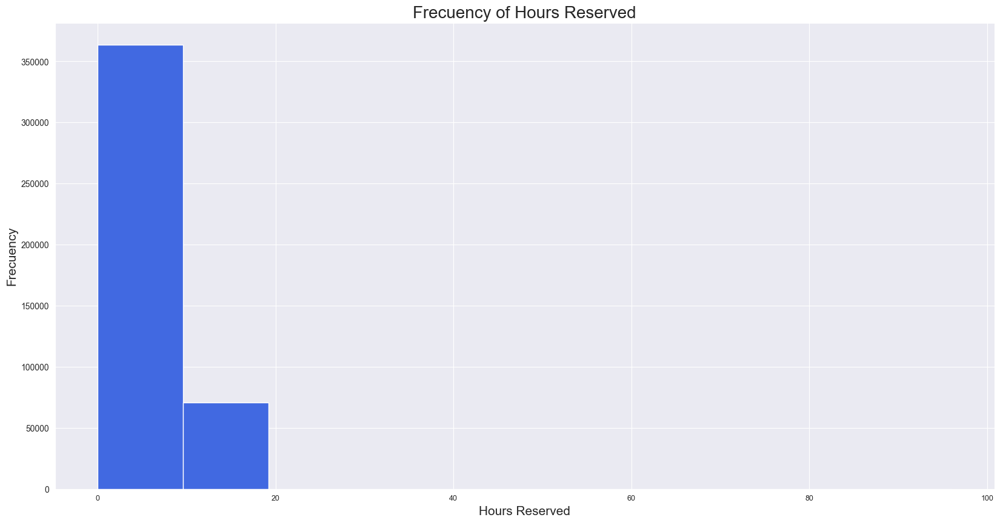

In [33]:
plt.figure(figsize=(20,10))

df_filtered['hours_reserved'].hist(bins=10, color="royalblue")

plt.title("Frecuency of Hours Reserved", fontsize=20)

plt.xlabel("Hours Reserved", fontsize=15)
plt.ylabel("Frecuency", fontsize=15)
plt.xticks(fontsize=9)

plt.show()

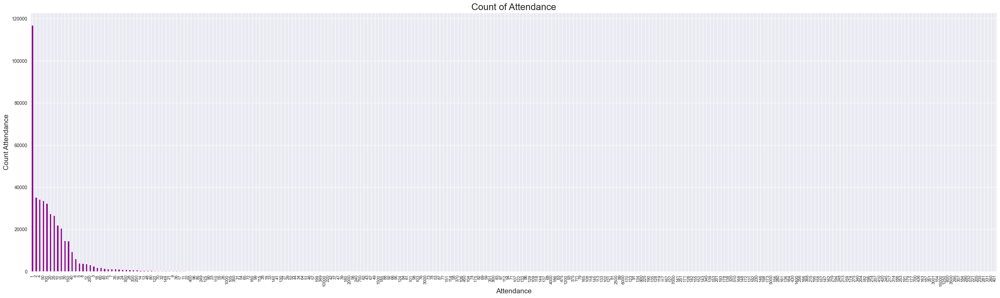

In [37]:
plt.figure(figsize=(37,10))

df_filtered['attendance'].value_counts().plot(kind='bar', color='darkmagenta')

plt.title("Count of Attendance", fontsize=20)
plt.xlabel("Attendance", fontsize=15)
plt.ylabel("Count Attendance", fontsize=15)
plt.xticks(fontsize=9)

plt.show()

The highest value of hours reserved is between 1 and 3. This indicates that the market is dominated by short-time events, and the attendance hour is half of the reservation time.

#### HOURS RESERVED BY COSTUMER GENDER

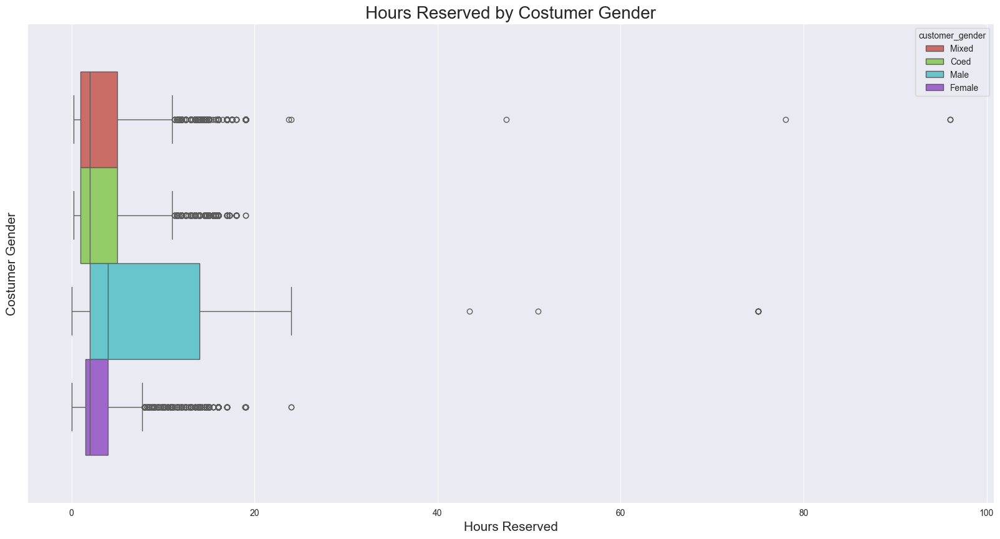

In [38]:
plt.figure(figsize=(20,10))

sns.boxplot(data=df_filtered, x= "hours_reserved", hue="customer_gender", palette=colors_arbitrary)

plt.title("Hours Reserved by Costumer Gender", fontsize=20)
plt.xlabel("Hours Reserved", fontsize=15)
plt.ylabel("Costumer Gender", fontsize=15)
plt.xticks(fontsize=10)

plt.show()

There are some outliers above 20 hours, let's remove them from the dataset:

In [39]:
df_filtered_2= df_filtered[df_filtered["hours_reserved"]<=20]
print("dataset before: ", df_filtered["hours_reserved"].shape)
print("dataset after: ", df_filtered_2["hours_reserved"].shape)

dataset before:  (434216,)
dataset after:  (434197,)


Not much data was removed from the dataset; we can work with it.

Let’s see the box plot without outliers:

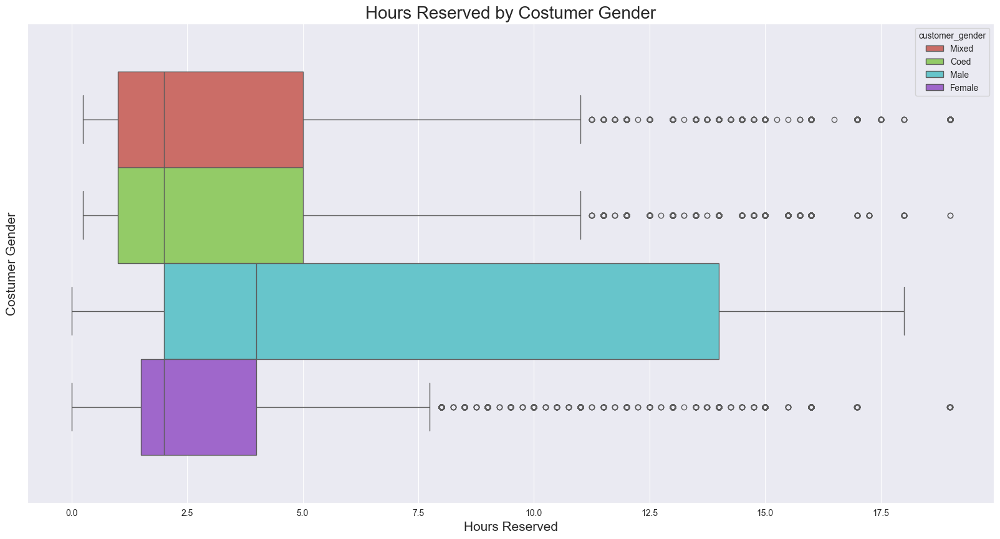

In [40]:
plt.figure(figsize=(20,10))

sns.boxplot(data=df_filtered_2, x= "hours_reserved", hue="customer_gender", palette=colors_arbitrary)

plt.title("Hours Reserved by Costumer Gender", fontsize=20)
plt.xlabel("Hours Reserved", fontsize=15)
plt.ylabel("Costumer Gender", fontsize=15)
plt.xticks(fontsize=10)

plt.show()

There is a bias to the left; the data is concentrated between 1 and 4. However, the male gender is more widely distributed, expanding to approximately 13 hours. We should explore the activities that each gender engages in:

In [41]:
df_filtered_male=df_filtered[df_filtered['customer_gender']=='Male']
df_filtered_female=df_filtered[df_filtered['customer_gender']=='Female']

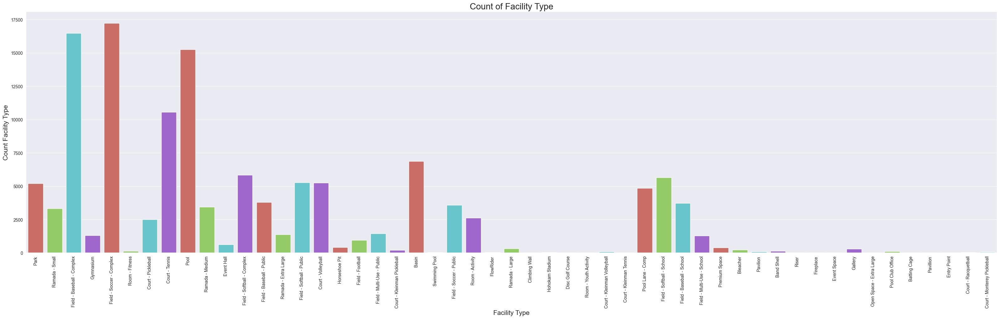

In [42]:
plt.figure(figsize=(40,10))

sns.countplot(data=df_filtered_male, x="facility_type", palette=colors_arbitrary)

plt.title("Count of Facility Type", fontsize=20)
plt.xlabel("Facility Type", fontsize=15)
plt.ylabel("Count Facility Type", fontsize=15)
plt.xticks(rotation=90, fontsize=10)

plt.show()

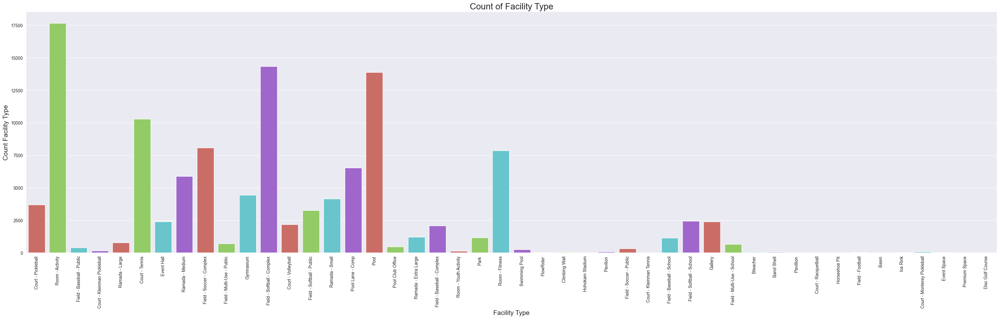

In [43]:
plt.figure(figsize=(40,10))

sns.countplot(data=df_filtered_female, x="facility_type", palette=colors_arbitrary)

plt.title("Count of Facility Type", fontsize=20)
plt.xlabel("Facility Type", fontsize=15)
plt.ylabel("Count Facility Type", fontsize=15)
plt.xticks(rotation=90, fontsize=10)

plt.show()

We see that the most demanded activities (determined by facility type) for men are baseball, soccer, tennis, and pool, and the most demanded activities (determined by facility type) for women are room (activity and fitness), softball, tennis, and pool. The mean male hours reserved is 3, because of the 3-hour of baseball match duration. The distribution to right in male hours is caused by the long duration Basin activities like Fishing.

#### OUTLIERS BY ATTENDANCE 

Let's check attendance for see more outliers:

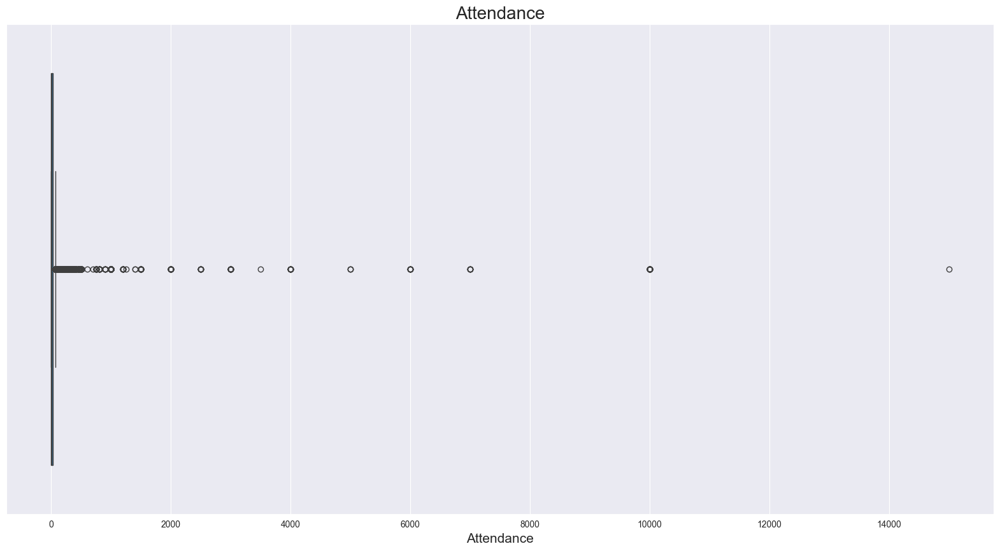

In [44]:
plt.figure(figsize=(20,10))

sns.boxplot(data=df_filtered, x= "attendance")

plt.title("Attendance", fontsize=20)
plt.xlabel("Attendance", fontsize=15)
plt.xticks(fontsize=10)

plt.show()

There are several outliers, so we must remove them progressively:

In [45]:
df_filtered_3= df_filtered_2[df_filtered_2["attendance"]<=900]
print("dataset before: ", df_filtered_2["attendance"].shape)
print("dataset after: ", df_filtered_3["attendance"].shape)

dataset before:  (434197,)
dataset after:  (433937,)


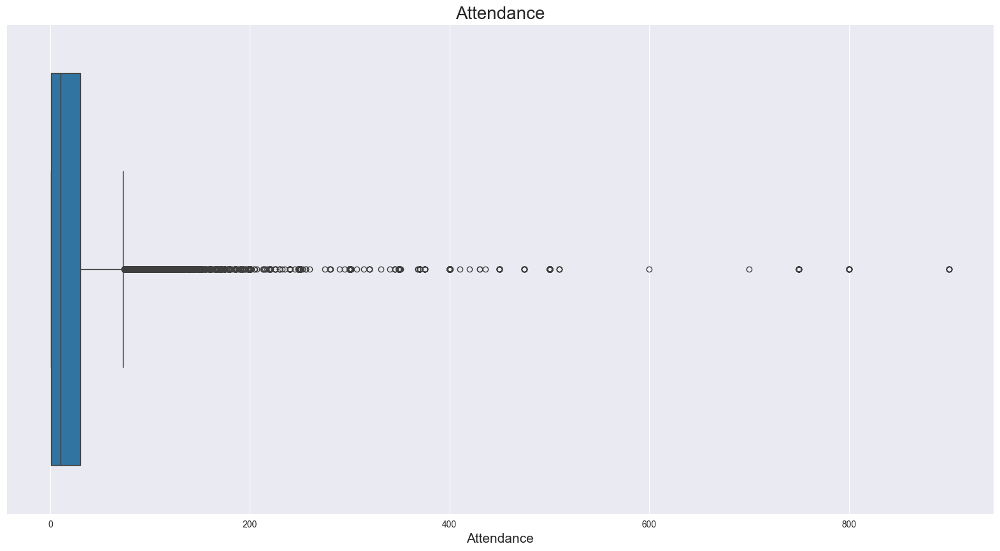

In [46]:
plt.figure(figsize=(20,10))

sns.boxplot(data=df_filtered_3, x= "attendance")
plt.title("Attendance", fontsize=20)
plt.xlabel("Attendance", fontsize=15)
plt.xticks(fontsize=10)

plt.show()

It's better, but we can improve it, let's do it:

dataset before:  (433937,)
dataset after:  (373533,)
---------------------------------------------------------------------------------------------------------------------------------------------------------------------


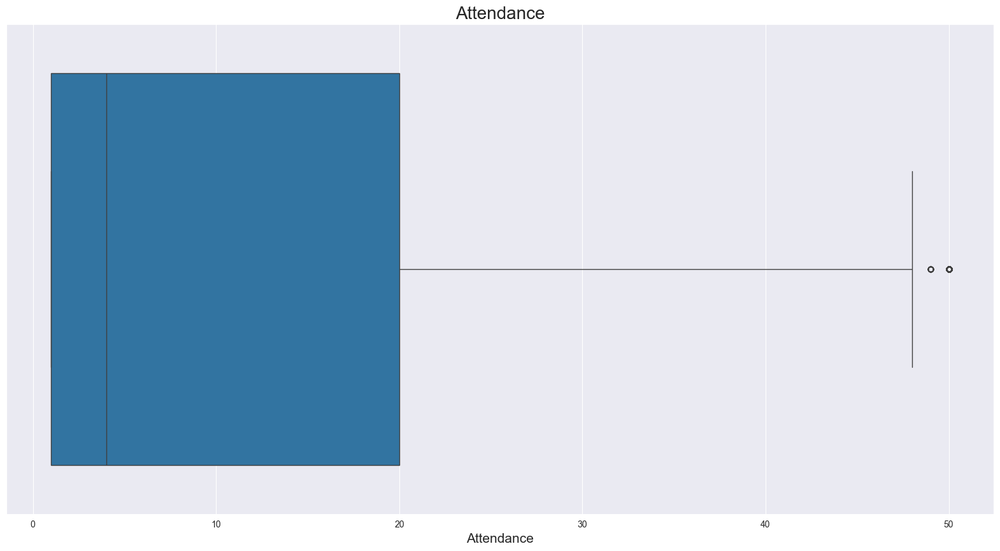

In [47]:
df_filtered_4= df_filtered_3[df_filtered_3["attendance"]<=50]
print("dataset before: ", df_filtered_3["attendance"].shape)
print("dataset after: ", df_filtered_4["attendance"].shape)
print("-"*165)
plt.figure(figsize=(20,10))
sns.boxplot(data=df_filtered_4, x= "attendance")
plt.title("Attendance", fontsize=20)
plt.xlabel("Attendance", fontsize=15)
plt.xticks(fontsize=10)

plt.show()

The outliers have been removed and we can work with this information in the next section.

#### ATTENDANCE BY COSTUMER GENDER

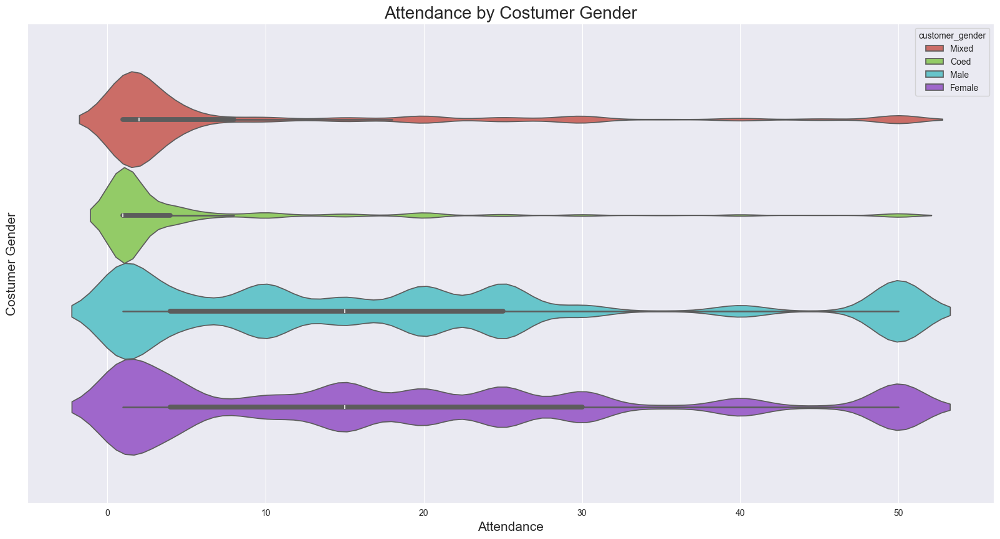

In [48]:
plt.figure(figsize=(20,10))

sns.violinplot(data=df_filtered_4, x= "attendance", hue="customer_gender", palette=colors_arbitrary)
plt.title("Attendance by Costumer Gender", fontsize=20)
plt.xlabel("Attendance", fontsize=15)
plt.ylabel("Costumer Gender", fontsize=15)
plt.xticks(fontsize=10)

plt.show()

Female, mixed, and coed activities have almost the same attendance level. However, in addition fact that men’s activities last longer means that when they are alone, they stay for a longer time in their activities.

#### SCHEDULE TYPE PERCENTAGE

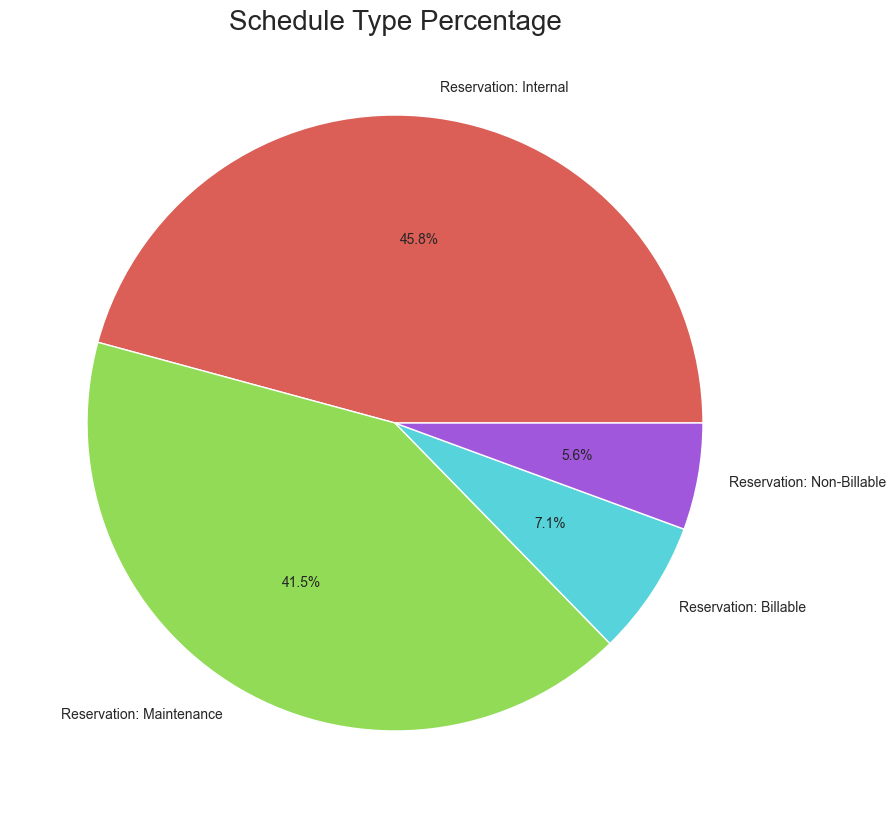

In [49]:
plt.figure(figsize=(10,10))

plt.pie(data=df_filtered, x = df_filtered['schedule_type'].value_counts(), labels = df_filtered['schedule_type'].unique(), 
        autopct='%1.1f%%', colors=colors_arbitrary)

plt.title("Schedule Type Percentage", fontsize=20)

plt.show()

In the case of internal reservations (which account for over 86%), they are typically used for carrying out cleaning, adaptation, or maintenance activities. For billable reservations, attendees prefer the security of adhering to their planned schedule rather than risking non-refundable expenses.

#### COUNT PERMIT YEAR

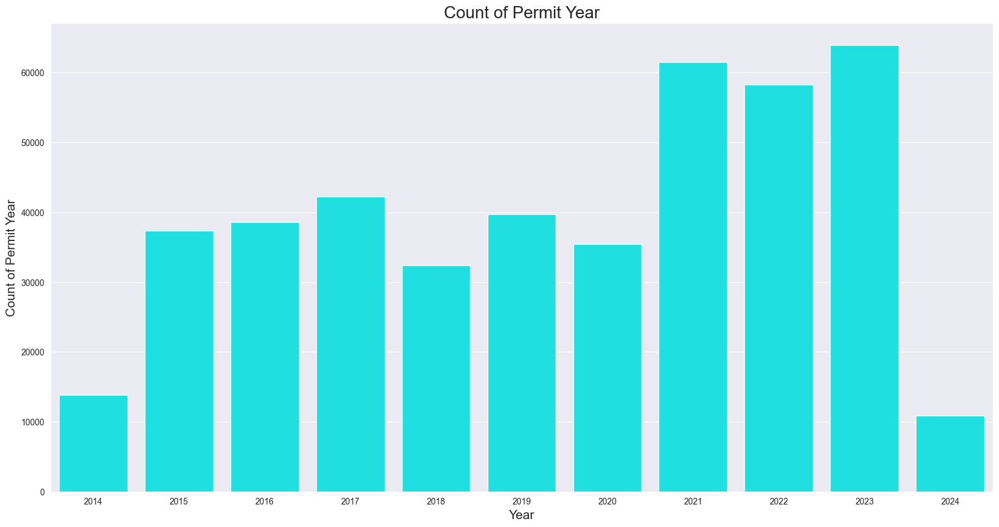

In [50]:
df_filtered_sortered = df_filtered.sort_values(by='permit_year', ascending=True)

plt.figure(figsize=(20,10))

sns.countplot(data=df_filtered_sortered, x="permit_year", color="aqua")

plt.title("Count of Permit Year", fontsize=20)
plt.xlabel("Year", fontsize=15)
plt.ylabel("Count of Permit Year", fontsize=15)
plt.xticks(fontsize=10)

plt.show()

We can see that after 2020, the demand has increased. Perhaps people were tired of staying at home and wanted to get out and have fun outdoors.

#### ATTENDANCE FOR YEARS

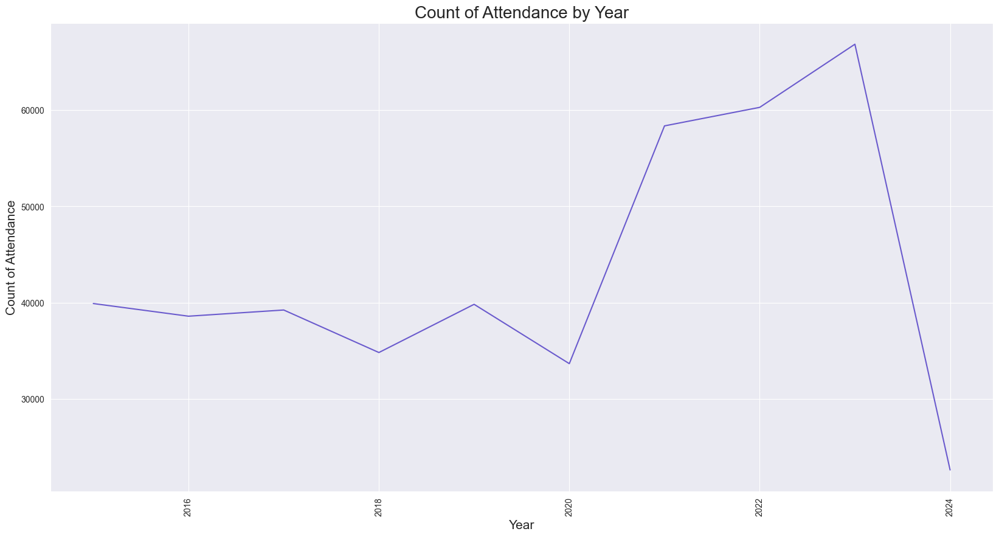

In [51]:
df_attend_year = df_filtered[["event_start_year","attendance"]]
df_attend_year = df_attend_year.groupby("event_start_year").size().reset_index(name='count_attendance')

plt.figure(figsize=(20,10))

sns.lineplot(data=df_attend_year,  x="event_start_year", y="count_attendance", color = 'slateblue')

plt.title("Count of Attendance by Year", fontsize=20)
plt.xlabel("Year", fontsize=15)
plt.ylabel("Count of Attendance", fontsize=15)
plt.xticks(rotation=90, fontsize=10)

plt.show()

Attendance increases after 2020, consistent with the last visualization, and theres is no seasonality.

#### ATTENDANCE IN EACH MONTH

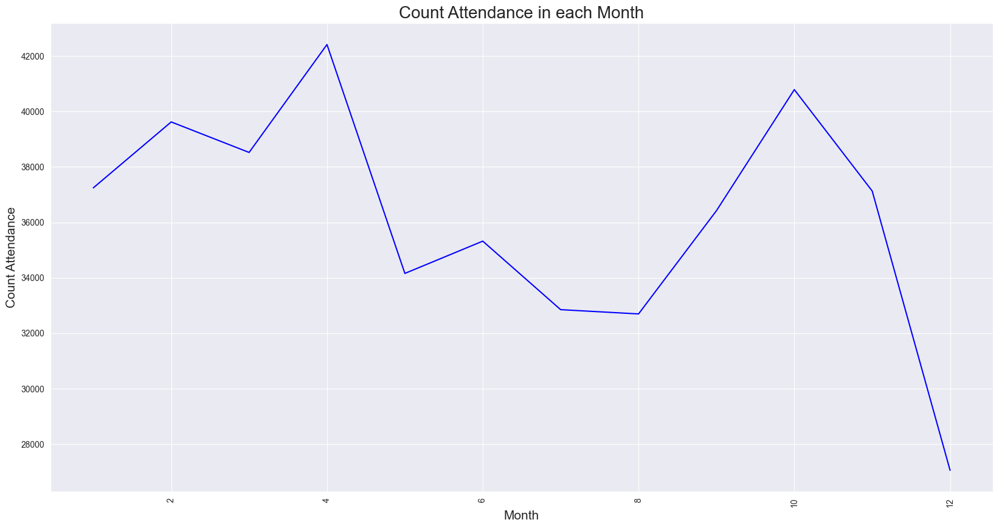

In [52]:
df_attend_month = df_filtered[["event_start_mounth_numeric","attendance"]]
df_attend_month = df_attend_month.groupby("event_start_mounth_numeric").size().reset_index(name='count_attendance')

plt.figure(figsize=(20,10))

sns.lineplot(data=df_attend_month, x="event_start_mounth_numeric", y="count_attendance",  color='b')

plt.title("Count Attendance in each Month", fontsize=20)
plt.xlabel("Month", fontsize=15)
plt.ylabel("Count Attendance", fontsize=15)
plt.xticks(rotation=90, fontsize=10)

plt.show()

Let’s view the activities in April and October:

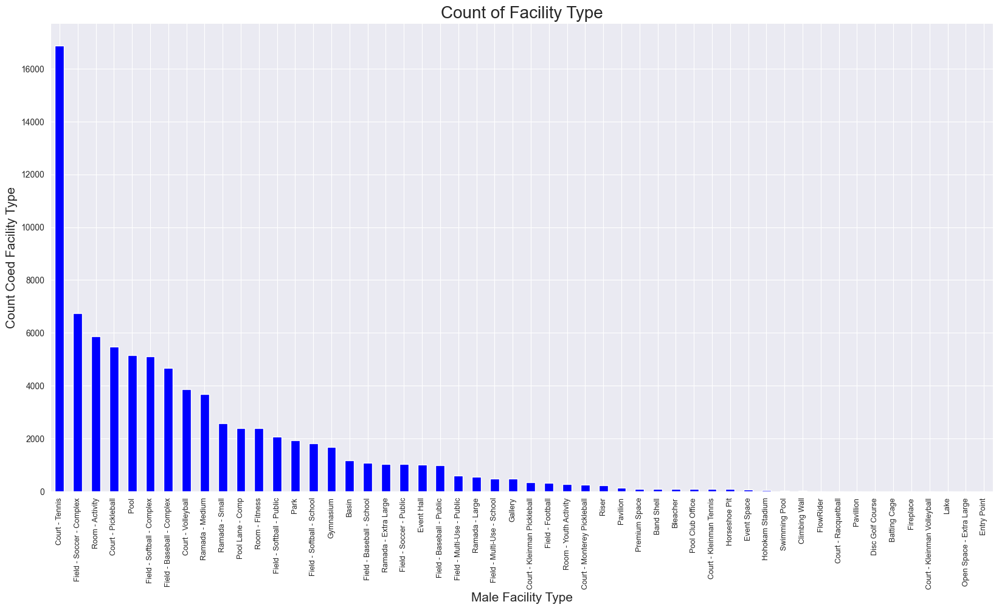

In [53]:
df_filtered_coed_jun_oct= df_filtered[(df_filtered["event_start_mounth_numeric"]==4) != (df_filtered["event_start_mounth_numeric"] == 10)]

plt.figure(figsize=(20,10))

df_filtered_coed_jun_oct['facility_type'].value_counts().plot(kind='bar', color="b")

plt.title("Count of Facility Type", fontsize=20)
plt.xlabel("Male Facility Type", fontsize=15)
plt.ylabel("Count Coed Facility Type", fontsize=15)
plt.xticks(fontsize=9)

plt.show()

In April, tennis and soccer activities were held during spring, possibly as part of a srping break activities program. In October, due to school break, educational institutions might also offer vacation activities programs.

#### ATTENDANCE BY DAY OF THE WEEK

In [54]:
df_filtered.reset_index(drop=True, inplace=True)

day_dict = {"Monday": 1, "Tuesday": 2, "Wednesday": 3, "Thursday": 4,"Friday": 5, "Saturday": 6, "Sunday": 7}
num_day_dic_col=df_filtered['day_of_week'].map(day_dict).tolist()
num_day_dic_col = pd.DataFrame(num_day_dic_col, columns=['number_day_of_week'])

df_filtered['day_of_week_numeric'] = num_day_dic_col

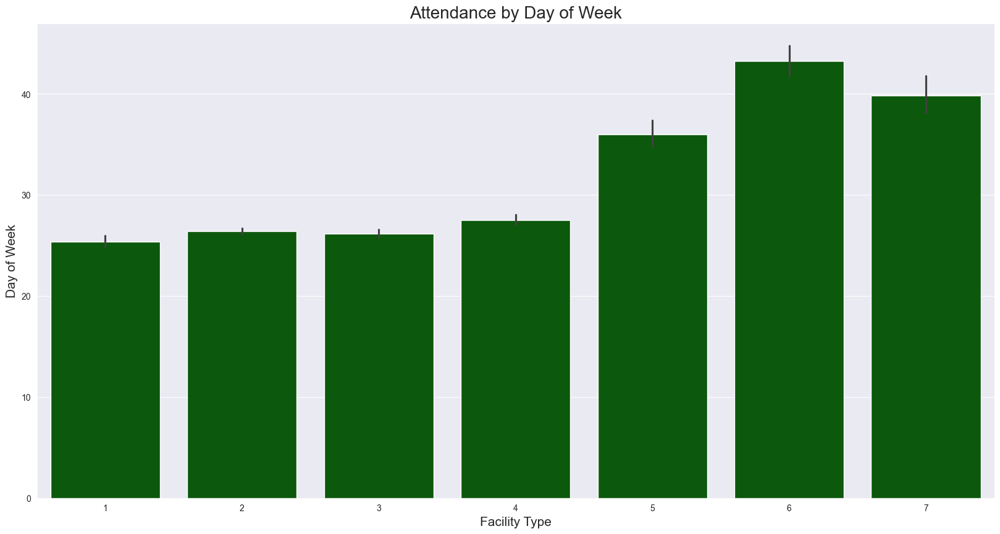

In [55]:
df_filtered_sortered_2=df_filtered.sort_values(by=['day_of_week_numeric'])

plt.figure(figsize=(20,10))

sns.barplot(data=df_filtered_sortered_2, x="day_of_week_numeric", y="attendance", color="darkgreen")

plt.title("Attendance by Day of Week", fontsize=20)
plt.xlabel("Facility Type", fontsize=15)
plt.ylabel("Day of Week", fontsize=15)
plt.xticks(fontsize=10)

plt.show()

Monday to Thursday has a similar attendance level, but, as we expected, Friday and the weekend have increased the attendance level, especially Saturday.

#### ATTENDANCE BY FACILITY TYPE

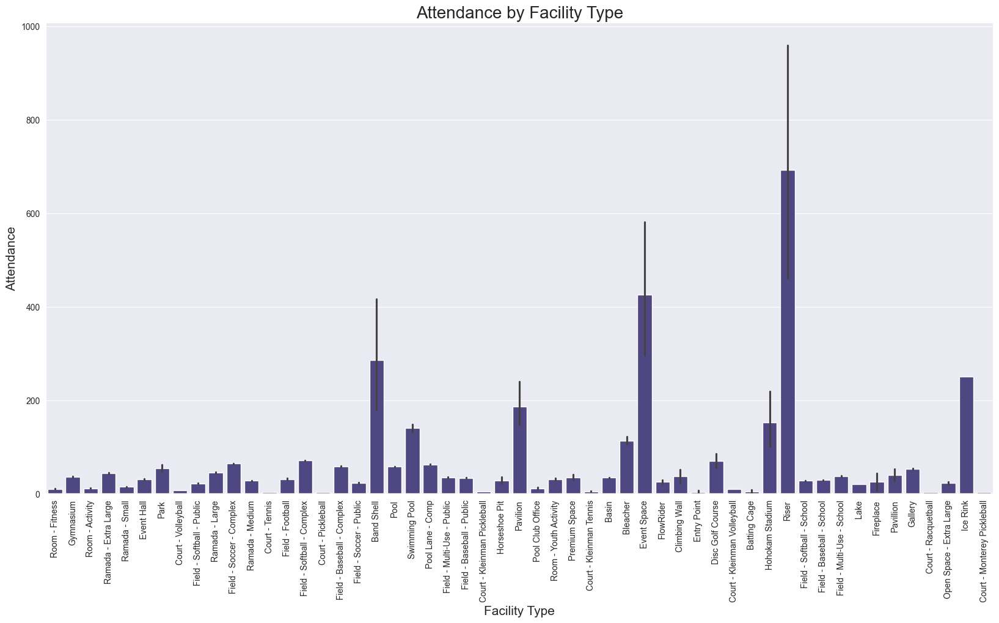

In [56]:
plt.figure(figsize=(20,10))

sns.barplot(data=df_filtered, x="facility_type", y="attendance", color="darkslateblue")

plt.title("Attendance by Facility Type", fontsize=20)
plt.xlabel("Facility Type", fontsize=15)
plt.ylabel("Attendance", fontsize=15)
plt.xticks(rotation=90, fontsize=10)

plt.show()

Despite the tendencies observed, the most common facility types are Riser and Event Space. This could be due to many different activities occurring throughout the year that do not involve sports. So, we can see that these types of facilities are predominant.

#### COUNT EVENT START TIME

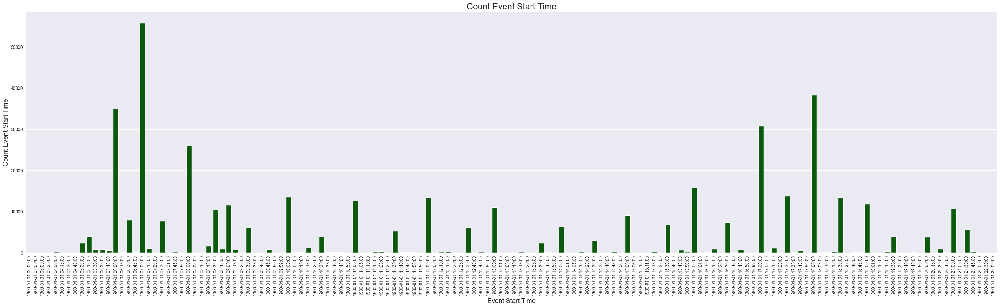

In [57]:
df_filtered_sortered_3=df_filtered.sort_values(by=['event_start_time'])

plt.figure(figsize=(40,10))

sns.countplot(data=df_filtered_sortered_3, x="event_start_time",color="darkgreen")

plt.title("Count Event Start Time", fontsize=20)
plt.xlabel("Event Start Time", fontsize=15)
plt.ylabel("Count Event Start Time", fontsize=15)
plt.xticks(rotation=90,fontsize=10)

plt.show()

There are two peaks: the first one is between 6:00 - 8:00 hours, and the second is between 17:00 - 18:00 hours. It’s natural to have these peaks, and there is an opportunity to do something during the midday hours.

#### EVENT DURATION

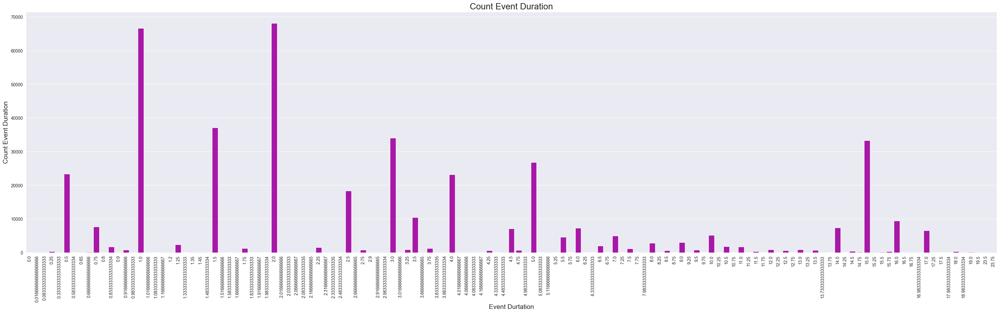

In [34]:
df_filtered_sortered_4=df_filtered.sort_values(by=['event_duration'])

plt.figure(figsize=(40,10))

sns.countplot(data=df_filtered_sortered_4, x="event_duration",color="m")

plt.title("Count Event Duration", fontsize=20)
plt.xlabel("Event Durtation", fontsize=15)
plt.ylabel("Count Event Duration", fontsize=15)
plt.xticks(rotation=90,fontsize=10)

plt.show()

The hours 1, 1.5, and 2 are the top event durations, but there are some events with 15 hours. This means that short-duration events are very common and represent an opportunity to increase income by specializing in events with this duration. Let's see what types of events are developed:

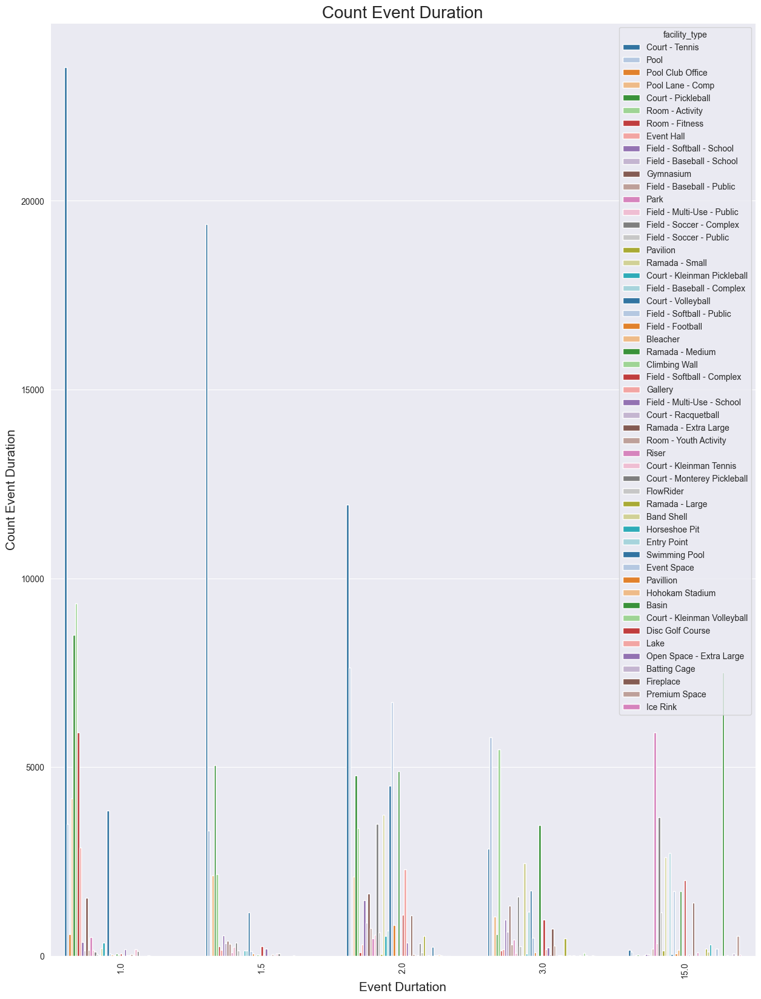

In [35]:
df_filtered_sortered_4_1 = df_filtered_sortered_4[df_filtered_sortered_4["event_duration"].isin([1, 1.5, 2, 3, 15])]

plt.figure(figsize=(15,20))

sns.countplot(data=df_filtered_sortered_4_1, x="event_duration", palette="tab20", hue=df_filtered_sortered_4_1['facility_type'])

plt.title("Count Event Duration", fontsize=20)
plt.xlabel("Event Durtation", fontsize=15)
plt.ylabel("Count Event Duration", fontsize=15)
plt.xticks(rotation=90,fontsize=10)

plt.show()


Tennis, Pickleball, and 'Room activity' are the most common events, so we can leverage them.

#### COUNT RESIDENCY FLAG

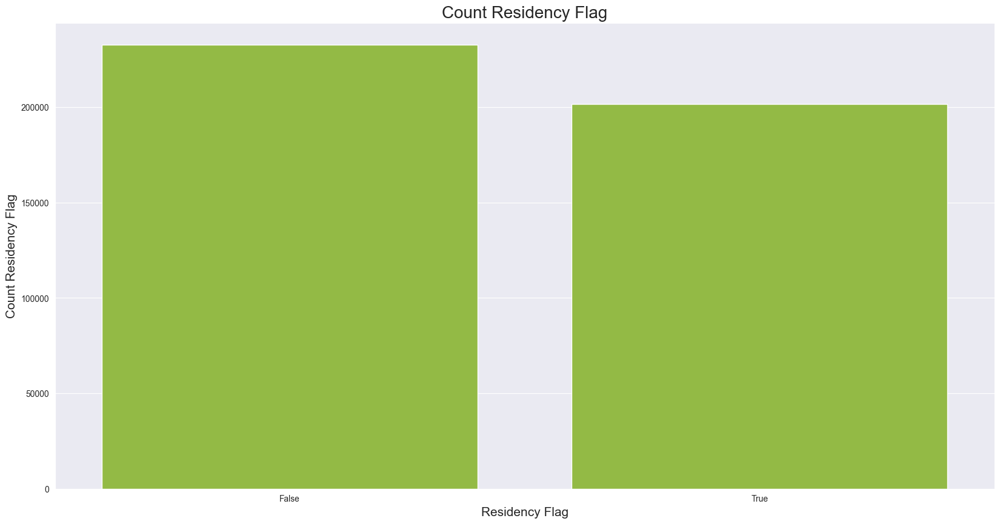

In [60]:
plt.figure(figsize=(20,10))

sns.countplot(data=df_filtered, x="residency_flag",color="yellowgreen")

plt.title("Count Residency Flag", fontsize=20)
plt.xlabel("Residency Flag", fontsize=15)
plt.ylabel("Count Residency Flag", fontsize=15)
plt.xticks(fontsize=10)

plt.show()

There are numerous external users, outnumbering the residents. Consequently, we can conduct field investigations to comprehend the reasons behind this phenomenon and explore why these external users are drawn to these center.

#### PERMIT HOUR BY MOUNTH

Let’s examine the column permit hour to verify that we could find some insights:

In [61]:
df_filtered.reset_index(drop=True, inplace=True)

month_dict = {"January":1, "February":2, "March":3, "April":4, "May":5, "June":6, "July":7, "August":8, "September":9, "October":10, "November":11, "December":12}
num_month_dic_col=df_filtered['permit_month'].map(month_dict).tolist()
num_month_dic_col = pd.DataFrame(num_month_dic_col, columns=['number_month'])

df_filtered['permit_month_numeric'] = num_month_dic_col


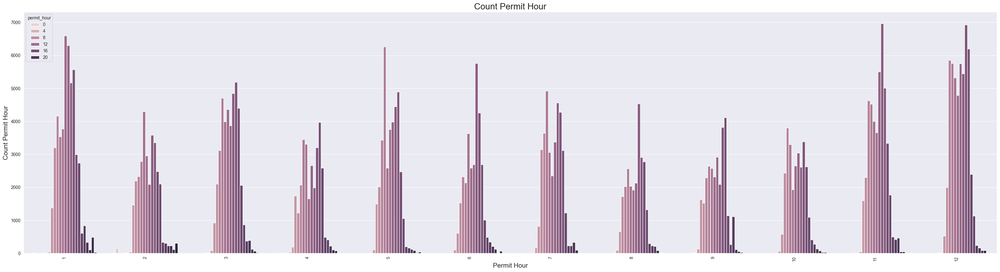

In [62]:
df_filtered_sortered_5=df_filtered.sort_values(by='permit_month_numeric', ascending=True)

plt.figure(figsize=(40,10))

sns.countplot(data=df_filtered_sortered_5, x="permit_month_numeric", hue="permit_hour")

plt.title("Count Permit Hour", fontsize=20)
plt.xlabel("Permit Hour", fontsize=15)
plt.ylabel("Count Permit Hour", fontsize=15)
plt.xticks(rotation=90,fontsize=10)

plt.show()

Well, this information could bring us a productivity hour analysis, and we can balance the workload. By the way, we can see some activity after 19:00 until midnight, and it’s not good for the office workers.


### INTERACTIVE MAP VISUALIZATION

Let’s see the facilities localization on the map; we could find some features from this visualization:

If all data is included, the system will collapse, so we have to extract some data for the visualization:

In [63]:
df_filtered_sample=df_filtered.sample(3000)

In [64]:
mesa_map=folium.Map(location=[33.40598, -111.73645], zoom_start=12)

centers_map= folium.map.FeatureGroup()

for lat,long,label in zip(df_filtered_sample['center_latitude'],df_filtered_sample['center_longitude'],df_filtered_sample['facility_name']):
    
    centers_map.add_child(folium.features.CircleMarker([lat,long], radius=5, color='yellow', fill=True, fill_color='blue',fill_opacity=0.6))
    folium.Marker([lat,long], popup=label).add_to(mesa_map)

mesa_map.add_child(centers_map)

MousePosition().add_to(mesa_map)

mesa_map

With this information, we can identify opportunity areas to build new centers, or create stores near existing centers that offer clothes, tools, equipment, and gadgets that would use in sports or events. There are a lot of facilities near Mesa Airport; it promotes tourism and increases city income.

In [65]:

bounds_1 = [[33.43252 - 0.045, -111.67173 - 0.045],
          [33.43252 + 0.045, -111.67173 + 0.045]]

mesa_map.fit_bounds(bounds_1)

mesa_map




Look at this area. If we see the facility names, we can see that they're not the same type. There is a variety of facilities that complement each other, even though economies of scale dictate they should be similar

### WORDCLOUD VISUALIZATION

Finally, we can explore the facilities names and find what are the common terms used to name the centers.

In [66]:
df_filtered.reset_index(inplace=True)
df_filtered['facility_name'] = df_filtered['facility_name'].astype(str)

In [67]:
df_filtered['facility_name'].dtypes

dtype('O')

In [68]:
list=df_filtered['facility_name'].tolist()
string=""
for element in list:
    string += element + ", "

string= string.rstrip(", ")

In [69]:
mezaaz_mask = np.array(Image.open(urllib.request.urlopen("https://i.ibb.co/gWYRs2y/mesa.jpg")))

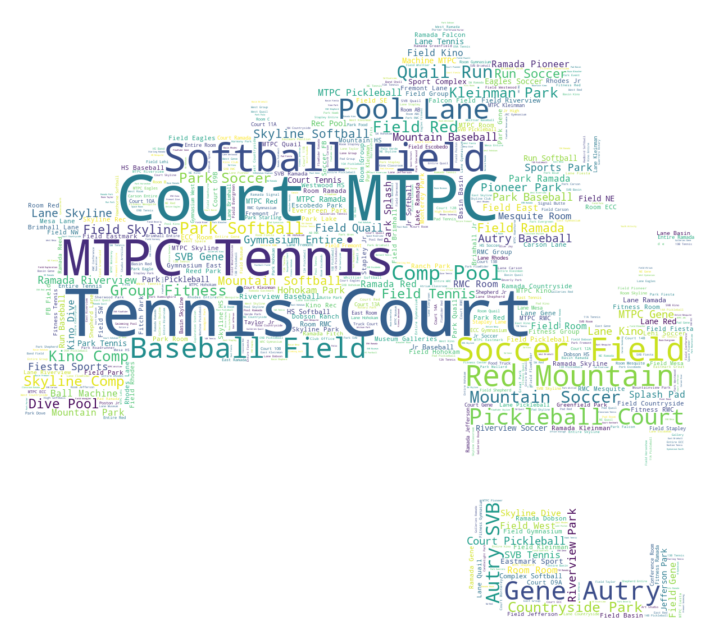

In [70]:
stopwords = set(STOPWORDS)
prcf_wordcloud = WordCloud(background_color="white", max_words=500000, stopwords=stopwords,mask=mezaaz_mask)
prcf_wordcloud.generate(string)

fig= plt.figure(figsize=(15,8))

plt.imshow(prcf_wordcloud, interpolation='bilinear')
plt.axis('off')

plt.show()

“Court”, “Tennis”, “Court", "MTPC", “Soccer”, “Softball” and “Red Mountain” are the most common terms in a facility name, so we could think of a new game combining old familiar elements with new, striking, and fancy terms.

We can save the dataset df_filtered taking advantage of the new columns for future analysis and Machine Learning models:

In [71]:
project_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
data_dir = os.path.join(project_dir, "data", "processed")
os.makedirs(data_dir, exist_ok=True)

In [72]:
output_path = os.path.join(data_dir, "df_filtered.csv")
df_filtered.to_csv(output_path, index=False)